In [2]:
import cv2 
import numpy as np
from tifffile import TiffFile
from math import sqrt
from skimage.feature import blob_dog, blob_log, blob_doh
import matplotlib.pyplot as plt



In [83]:

fh = r"F:\BactUnet\bactunet_val\OGM\EXP-20-BT0352\wt\hOGM_1_MMStack_Default.ome.tif\hOGM_1_MMStack_Default.ome.tif"

with TiffFile(fh) as tif:
    arr = tif.asarray()

arr = arr[1:-1,1,:,:]


fh = r"F:\BactUnet\thresholded_mcherry\global_otsu\masks_raw\hOGM_1_MMStack_Default.ome.tif"

with TiffFile(fh) as tif:
    arr_global = tif.asarray()

fh = r"F:\BactUnet\thresholded_mcherry\local_otsu\masks_raw\hOGM_1_MMStack_Default.ome.tif"

with TiffFile(fh) as tif:
    arr_local = tif.asarray()




In [89]:
i=150



print(arr.shape, arr.max(), arr.min(), arr[i].max(), arr[i].min(), arr[i].mean())
print(arr_global.shape, arr_global.max(), arr_global.min(), arr_global[i].max(), arr_global[i].min(), arr_global[i].mean())
print(arr_local.shape, arr_local.max(), arr_local.min(), arr_local[i].max(), arr_local[i].min(), arr_local[i].mean())






(238, 2304, 2304) 5677 36 210 47 104.65428331163194
(238, 2304, 2304) 5677 0 210 0 44.054674125012056
(238, 2304, 2304) 5677 0 210 0 44.054674125012056


In [100]:
def plot_comparison(images, names):
    n = len(images)
    fig, axis = plt.subplots(ncols=n, figsize=(n*10, 15), sharex=True,
                                   sharey=True)
    for image, name, ax in zip(images, names, axis):
        ax.imshow(image, cmap=plt.cm.gray)
        ax.set_title(name)
        ax.axis('off')
    

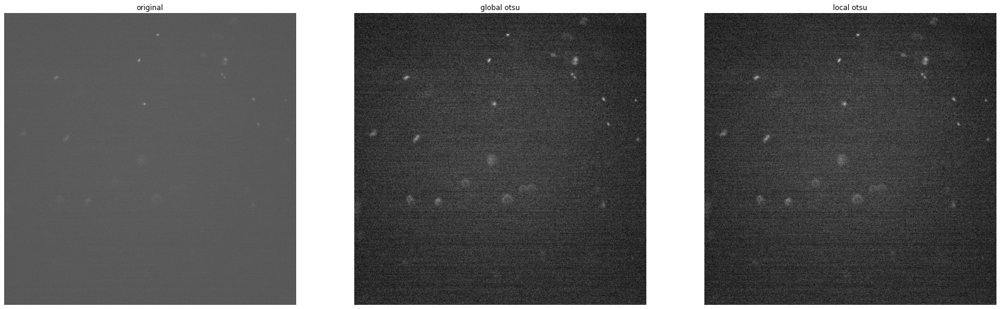

In [101]:
arrs = [arr[i], arr_global[i], arr_local[i]]
names = ['original', 'global otsu', 'local otsu']

plot_comparison(arrs, names)

In [115]:
from skimage.restoration import rolling_ball, ellipsoid_kernel
from  skimage.filters import gaussian

kernel = ellipsoid_kernel((25, 25), 75)

def apply_rolling_ball(frame):
    background = rolling_ball(frame, kernel=kernel)
    filtered_image = frame - background
    return filtered_image


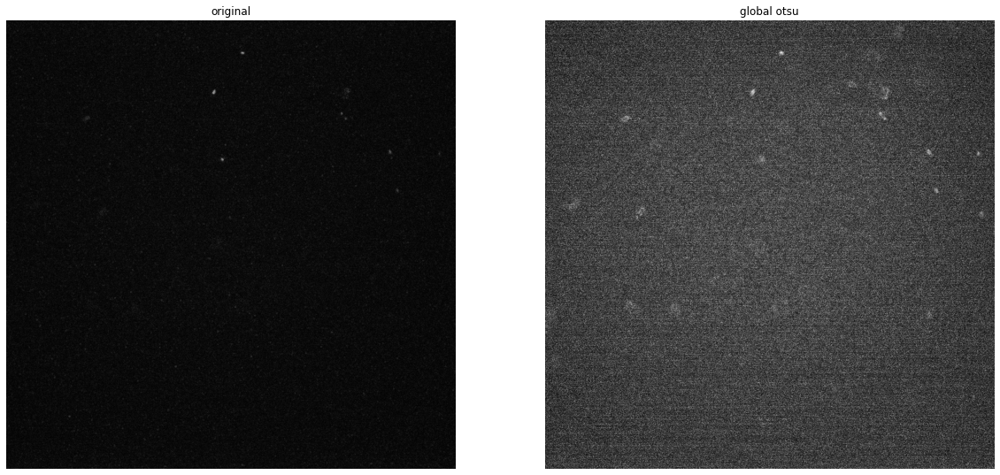

In [133]:
rb_arrs = []
for a in arrs[:-1]:
    a = gaussian(a, sigma=0.8, preserve_range=True)
    a = apply_rolling_ball(a)
    
    rb_arrs.append(a)
    
plot_comparison(rb_arrs, names)

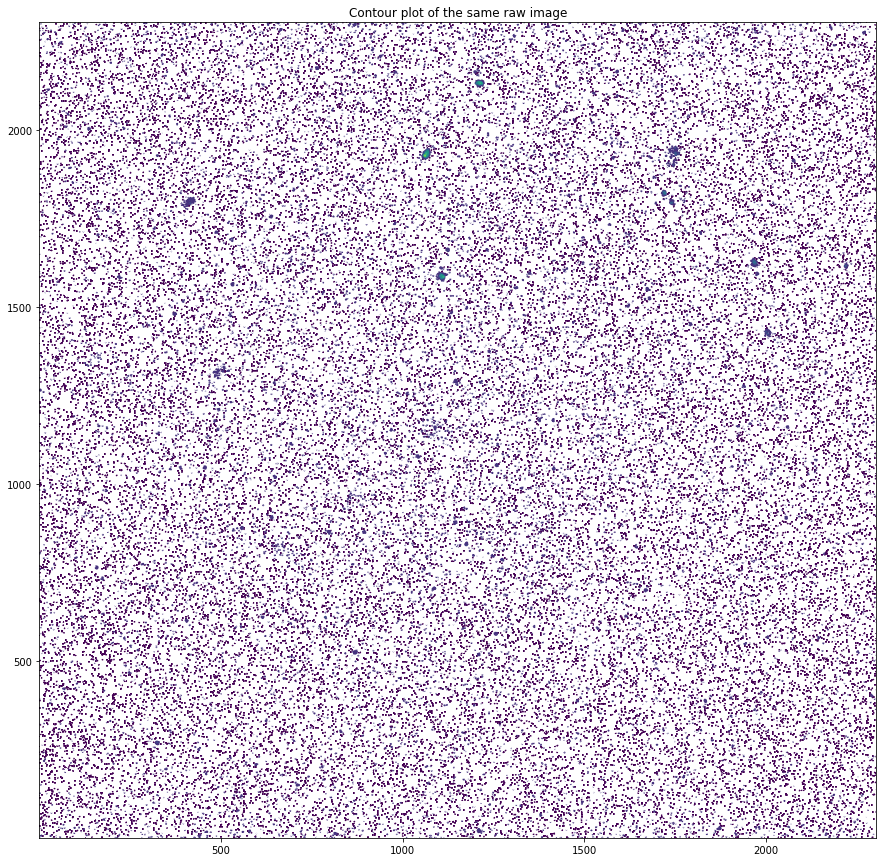

In [134]:
from skimage.morphology import (erosion, dilation, opening, closing, white_tophat)

from skimage import (color, feature, filters, measure, morphology, segmentation, util)

fig, ax = plt.subplots(figsize=(15, 15))
qcs = ax.contour(rb_arrs[0], origin='image')
ax.set_title('Contour plot of the same raw image')
plt.show()



In [136]:
import napari

viewer = napari.view_image(arr)

In [137]:
arr_blur = gaussian(arr, sigma=0.8, preserve_range=True)

viewer = napari.view_image(arr_blur)

In [140]:
arr_bb = np.zeros_like(arr_blur)

for i, frame in enumerate(arr_blur):
    
    arr_bb[i] = apply_rolling_ball(frame)

viewer = napari.view_image(arr_bb)

In [149]:
from skimage.filters import threshold_otsu

th = threshold_otsu(arr_bb)

print(arr.min(), arr.max(), arr_bb.min(), arr_bb.max(), th)

36 5677 0.0 1264.944677308222 2.470595072867621


In [153]:
test = arr_bb > th*2
test = erosion(test)
test = dilation(test)
viewer = napari.view_image(test)

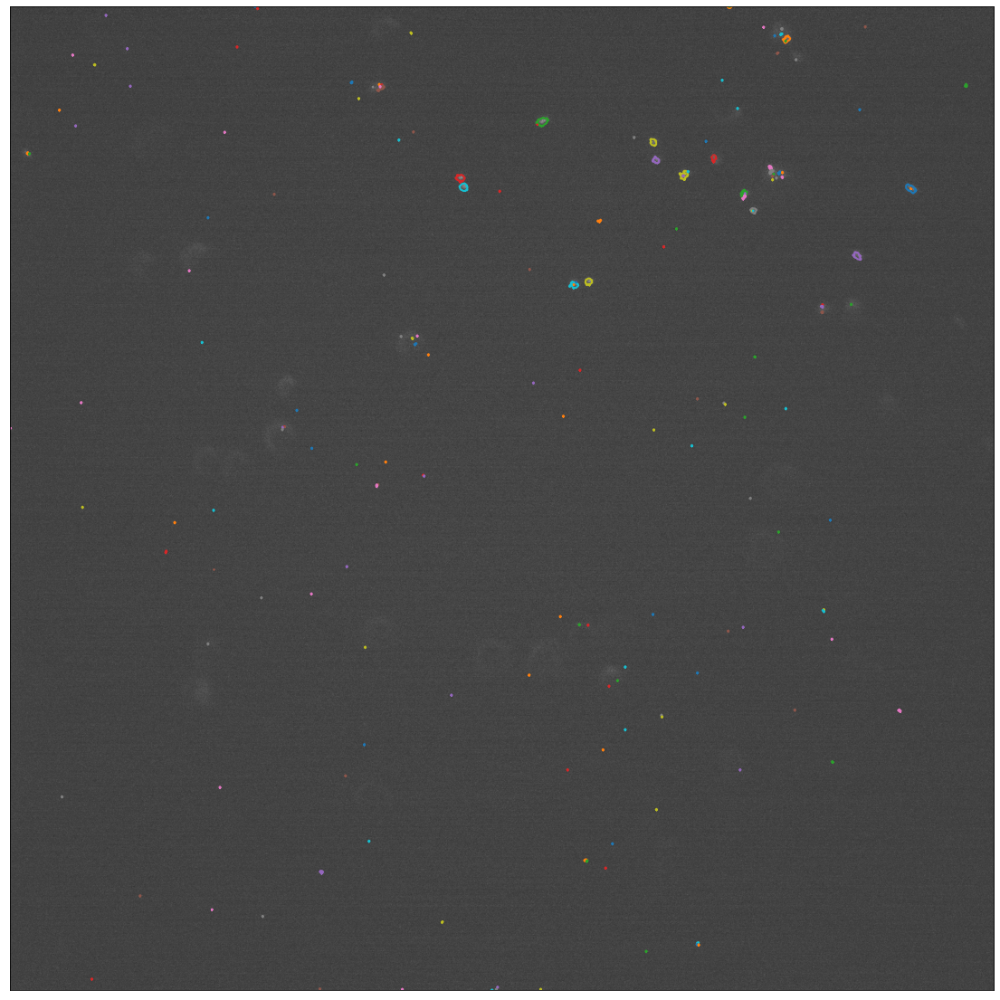

In [171]:
from skimage import measure

contours = measure.find_contours(test[i])

fig, ax = plt.subplots()
ax.imshow(arr[i], cmap=plt.cm.gray)

for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2)

ax.axis('image')
ax.set_xticks([])
ax.set_yticks([])
plt.show()

15


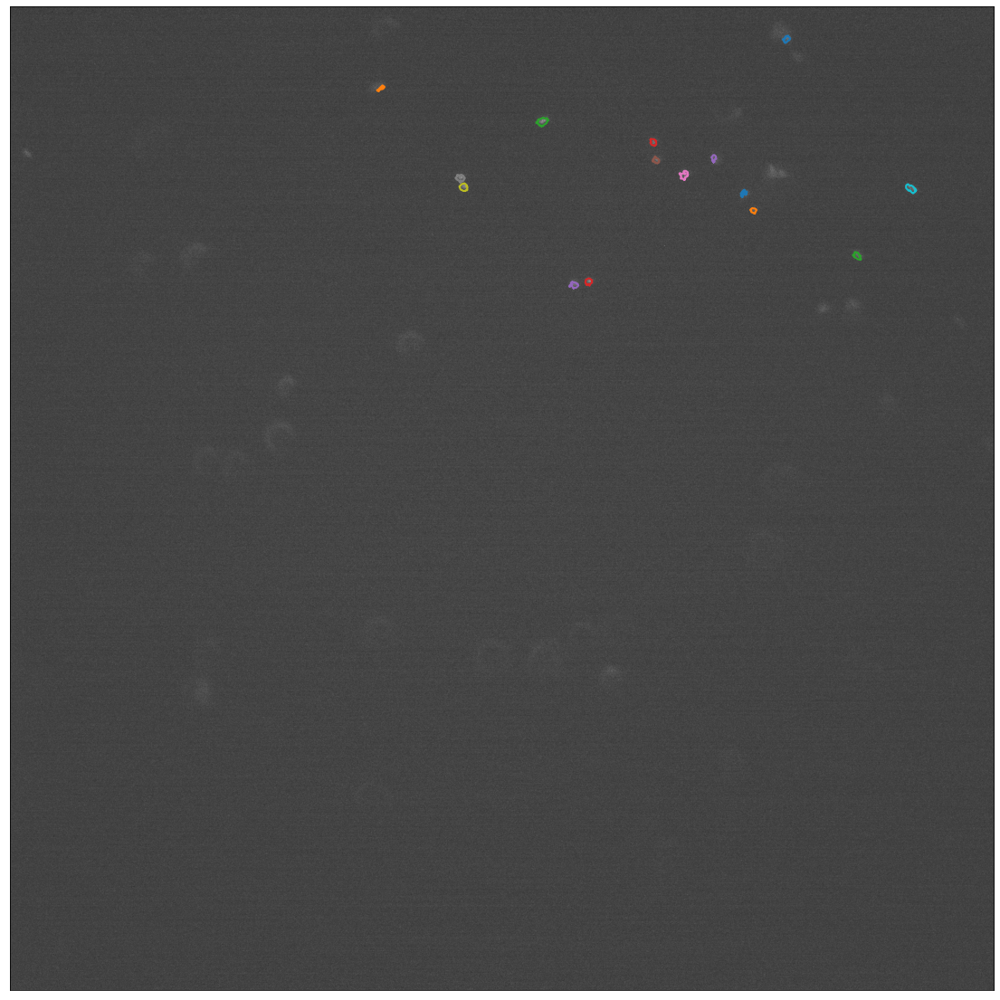

In [173]:
filtered_contours = []
for c in contours:
    if c.size > 100:
        filtered_contours.append(c)
        
fig, ax = plt.subplots()
ax.imshow(arr[i], cmap=plt.cm.gray)

for contour in filtered_contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2)
print(len(filtered_contours))
ax.axis('image')
ax.set_xticks([])
ax.set_yticks([])
plt.show()

In [179]:
frame_bact = []
filt_cntr=[]
for frame in test:
    nbact = 0
    cntr = []
    contours = measure.find_contours(frame)
    for c in contours:
        if c.size > 100:
            nbact += 1
            cntr.append(c)
    frame_bact.append(nbact)
    filt_cntr.extend(cntr)
print(frame_bact)    

[1, 1, 1, 2, 3, 3, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 4, 3, 3, 3, 3, 2, 2, 2, 1, 1, 0, 0, 0, 2, 1, 2, 2, 2, 2, 3, 2, 2, 2, 1, 3, 1, 1, 2, 1, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 4, 3, 3, 6, 4, 4, 4, 4, 4, 5, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 5, 5, 6, 6, 6, 6, 5, 5, 5, 4, 3, 4, 5, 6, 5, 5, 4, 5, 5, 5, 6, 6, 7, 7, 7, 7, 7, 7, 7, 9, 7, 7, 7, 6, 7, 7, 7, 7, 6, 5, 6, 7, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 6, 6, 8, 7, 8, 8, 7, 7, 9, 7, 9, 9, 10, 11, 9, 10, 10, 11, 10, 12, 12, 11, 10, 10, 9, 11, 12, 12, 12, 11, 13, 13, 11, 12, 12, 13, 12, 10, 10, 12, 10, 13, 12, 11, 13, 14, 15, 14, 15, 12, 15, 15, 12, 11, 12, 11, 12, 11, 16, 16, 17, 14, 15, 14, 13, 14, 14, 15, 15]


15


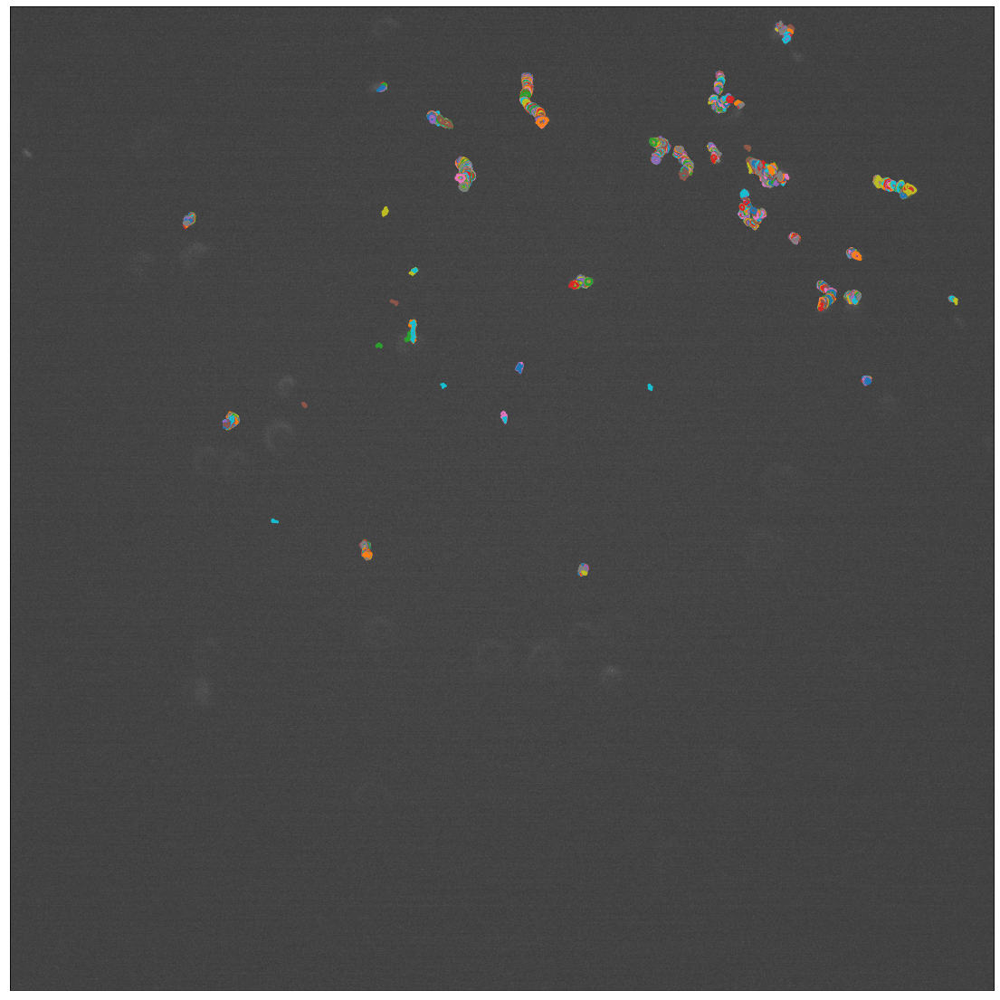

In [180]:
fig, ax = plt.subplots()
ax.imshow(arr[i], cmap=plt.cm.gray)

for contour in filt_cntr:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2)
print(len(filtered_contours))
ax.axis('image')
ax.set_xticks([])
ax.set_yticks([])
plt.show()
#viewer = napari.view_image(test)

In [21]:
#9.5 min per file 
import numpy as np
from tifffile import TiffFile
from skimage.restoration import rolling_ball, ellipsoid_kernel
from skimage.filters import gaussian
from quantification_comparrison import getTemporalMedianFilter


fh = r"F:\BactUnet\bactunet_val\OGM\EXP-20-BT0352\wt\hOGM_1_MMStack_Default.ome.tif\hOGM_1_MMStack_Default.ome.tif"

with TiffFile(fh) as tif:
    arr = tif.asarray()

med_arr = getTemporalMedianFilter(arr[:,1,:,:],doGlidingProjection=True, startFrame=0, stopFrame=arr.shape[0])
arr = arr[1:-1,1,:,:]

kernel = ellipsoid_kernel((25, 25), 75)

def apply_rolling_ball(frame):
    background = rolling_ball(frame, kernel=kernel)
    filtered_image = frame - background
    return filtered_image

def bg_subtract(arr):   
    bg_arr = []
    for i in len(arr):
        a = gaussian(arr[i], sigma=0.8, preserve_range=True)
        a = apply_rolling_ball(a)
        bg_arr.append(a)
    return bg_arr

bg_arr = bg_subtract(arr)
bg_med = bg_subtract(med_arr)


KeyboardInterrupt: 

In [22]:
from skimage.filters import threshold_otsu
from skimage.morphology import erosion, dilation
from skimage.measure import find_contours

def count_bacteria(arr):
    bact_per_frame = []
    filt_cntr = []
    for frame in arr:

        th = threshold_otsu(frame)
        frame = frame > th*2
        frame = erosion(frame)
        frame = dilation(frame)
        frame_bact = []
        nbact = 0
        cntr = []
        contours = find_contours(frame)
        for c in contours:
            if c.size > 100:
                nbact += 1
                cntr.append(c)
        bact_per_frame.append(nbact)
        filt_cntr.extend(cntr)
    return bact_per_frame, filt_cntr

raw_bact = count_bacteria(rb_arr)
med_bact = count_bacteria(med_rb)

Text(0, 0.5, 'n. bacteria')

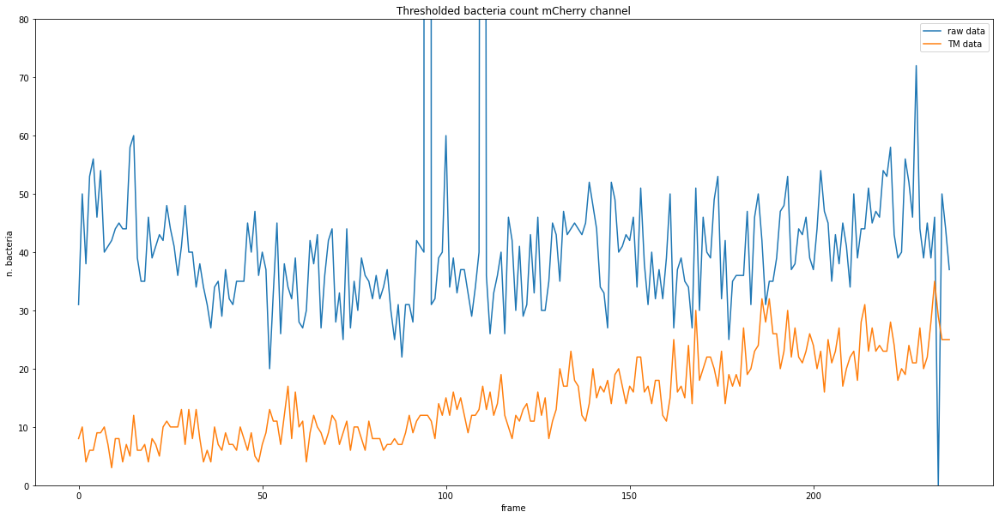

In [37]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(figsize=(20,10))
ax.plot(raw_bact[0], label='raw data')
ax.plot(med_bact[0], label='TM data')
ax.set_ylim(0,80)
ax.legend()
ax.set_title('Thresholded bacteria count mCherry channel')
ax.set_xlabel('frame')
ax.set_ylabel('n. bacteria')

In [1]:
def count_bacteria_and_return_contours(arr):

    bact_per_frame = []
    out = np.empty_like(arr)

    for i in range(len(arr)):
        frame = arr[i]
        ok_contours = []
        th = threshold_otsu(frame)
        frame = frame > th*2
        frame = erosion(frame)
        frame = dilation(frame)
        nbact = 0
        contours = find_contours(frame)
        for c in contours:
            if c.size > 100:
                nbact += 1
                ok_contours.append(c)
        for c in ok_contours:
            for x, y in zip(c[:, 1], c[:, 0]):
                out[i, int(x), int(y)] = 1
            
        bact_per_frame.append(nbact)

    return bact_per_frame, out

raw = count_bacteria_and_return_contours(rb_arr)
#med = count_bacteria(med_rb)

NameError: name 'rb_arr' is not defined

In [90]:
import napari
print(med[1].shape)

AttributeError: 'list' object has no attribute 'shape'

In [39]:
#All files analysed in external script

import pandas as pd
import seaborn as sns

df = pd.read_csv(r"F:\BactUnet\bacteria_count.csv")
print(df.head())

   frame  raw_nbact  TM_nbact condition     experiment bacteria  \
0      1         94         2       OGM  EXP-20-BT0401       wt   
1      2          8         1       OGM  EXP-20-BT0401       wt   
2      3          7         2       OGM  EXP-20-BT0401       wt   
3      4          5         2       OGM  EXP-20-BT0401       wt   
4      5          4         2       OGM  EXP-20-BT0401       wt   

                                            filepath  \
0  F:\BactUnet\bactunet_val\OGM\EXP-20-BT0401\wt\...   
1  F:\BactUnet\bactunet_val\OGM\EXP-20-BT0401\wt\...   
2  F:\BactUnet\bactunet_val\OGM\EXP-20-BT0401\wt\...   
3  F:\BactUnet\bactunet_val\OGM\EXP-20-BT0401\wt\...   
4  F:\BactUnet\bactunet_val\OGM\EXP-20-BT0401\wt\...   

                                filename  
0  anodisc_OGM_1_MMStack_Default.ome.tif  
1  anodisc_OGM_1_MMStack_Default.ome.tif  
2  anodisc_OGM_1_MMStack_Default.ome.tif  
3  anodisc_OGM_1_MMStack_Default.ome.tif  
4  anodisc_OGM_1_MMStack_Default.ome.tif  


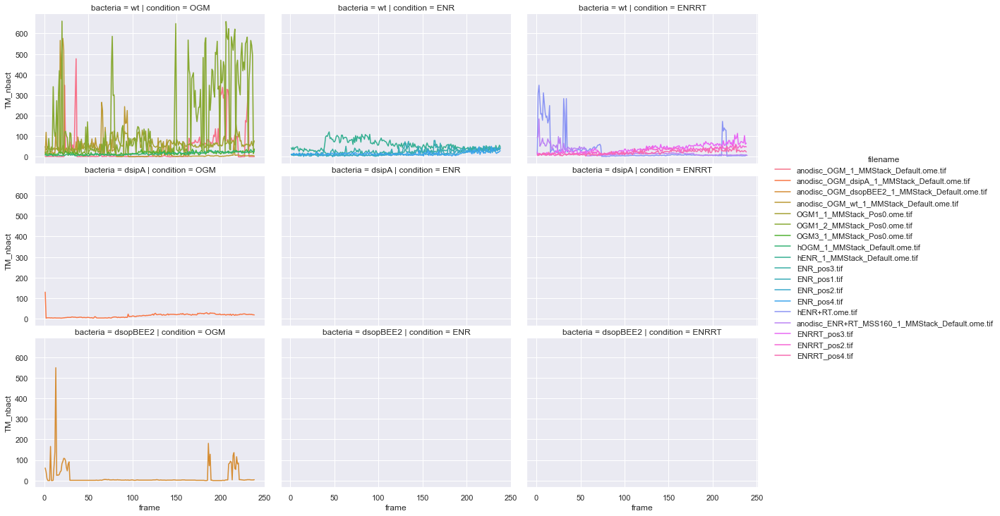

In [48]:
g = sns.relplot(data=df, x='frame', y='TM_nbact', kind='line', hue='filename', col='condition', row='bacteria')
g.figure.set_size_inches(20, 10)

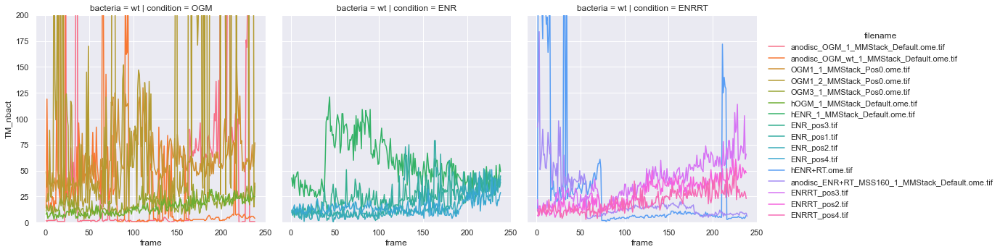

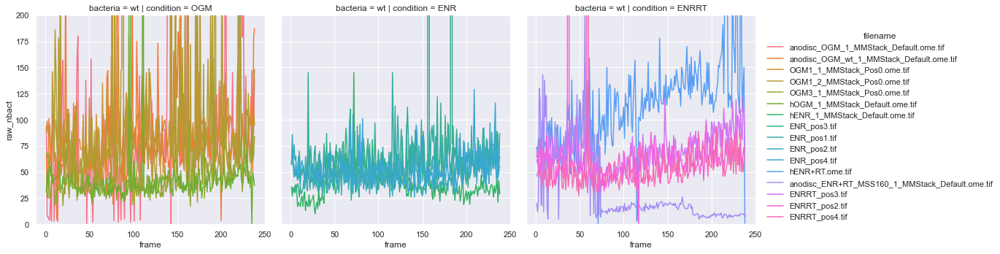

In [60]:
df2 = df[df.bacteria == 'wt']
g1 = sns.relplot(data=df2, x='frame', y='TM_nbact', kind='line', hue='filename', col='condition', row='bacteria')
g1.set(ylim=(0,200))
g2 = sns.relplot(data=df2, x='frame', y='raw_nbact', kind='line', hue='filename', col='condition', row='bacteria')
g2.set(ylim=(0,200))

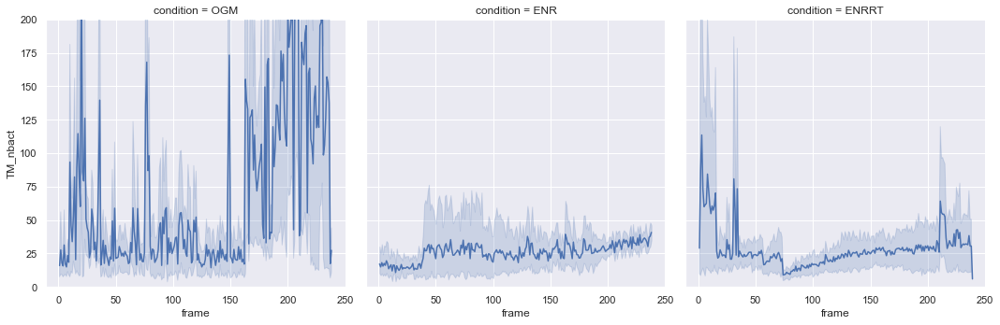

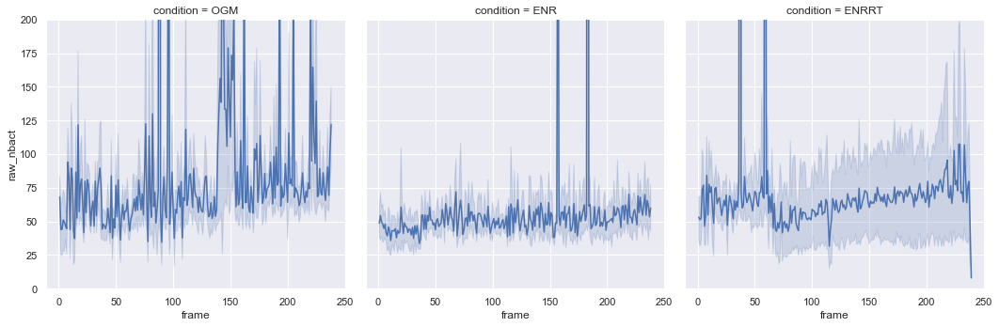

In [62]:
g1 = sns.relplot(data=df2, x='frame', y='TM_nbact', kind='line', col='condition')
g1.set(ylim=(0,200))
g2 = sns.relplot(data=df2, x='frame', y='raw_nbact',kind = 'line', col='condition')
g2.set(ylim=(0,200))

In [73]:
df3 = df2.drop(columns=('TM_nbact'))
df4 = df2.drop(columns=('raw_nbact'))
df3.rename(columns={'raw_nbact':'nbact'}, inplace=True)
df4.rename(columns={'TM_nbact':'nbact'}, inplace=True)
df3['source']='raw'
df4['source']='TM_filter'
df3 = pd.concat([df3, df4])
df3.describe()

,frame,nbact
count,8570.000000,8570.000000
mean,119.527888,59.514469
std,68.724314,154.959394
min,1.000000,0.000000
25%,60.000000,18.000000
50%,120.000000,42.000000
75%,179.000000,66.000000
max,239.000000,7648.000000


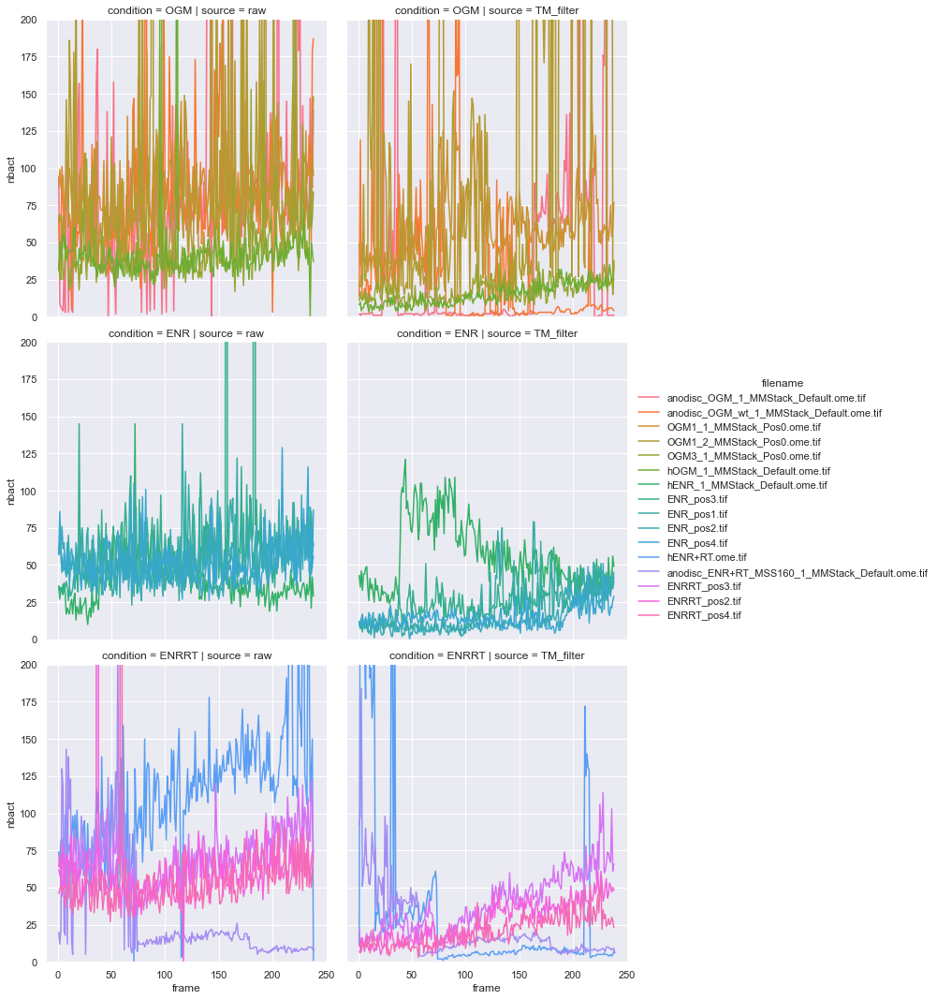

In [79]:
g1 = sns.relplot(data=df3, x='frame', y='nbact', hue='filename', kind='line', col='source', row='condition')
g1.set(ylim=(0,200))

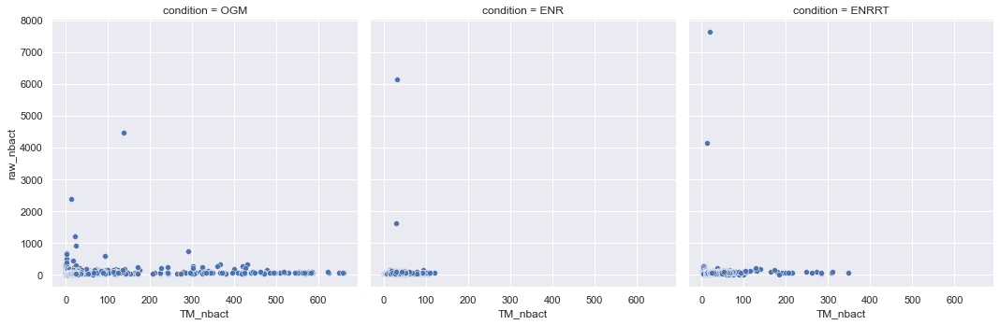

In [83]:
g2 = sns.relplot(data=df2, x='TM_nbact', y='raw_nbact', col='condition')


AttributeError: 'FacetGrid' object has no attribute 'figure'

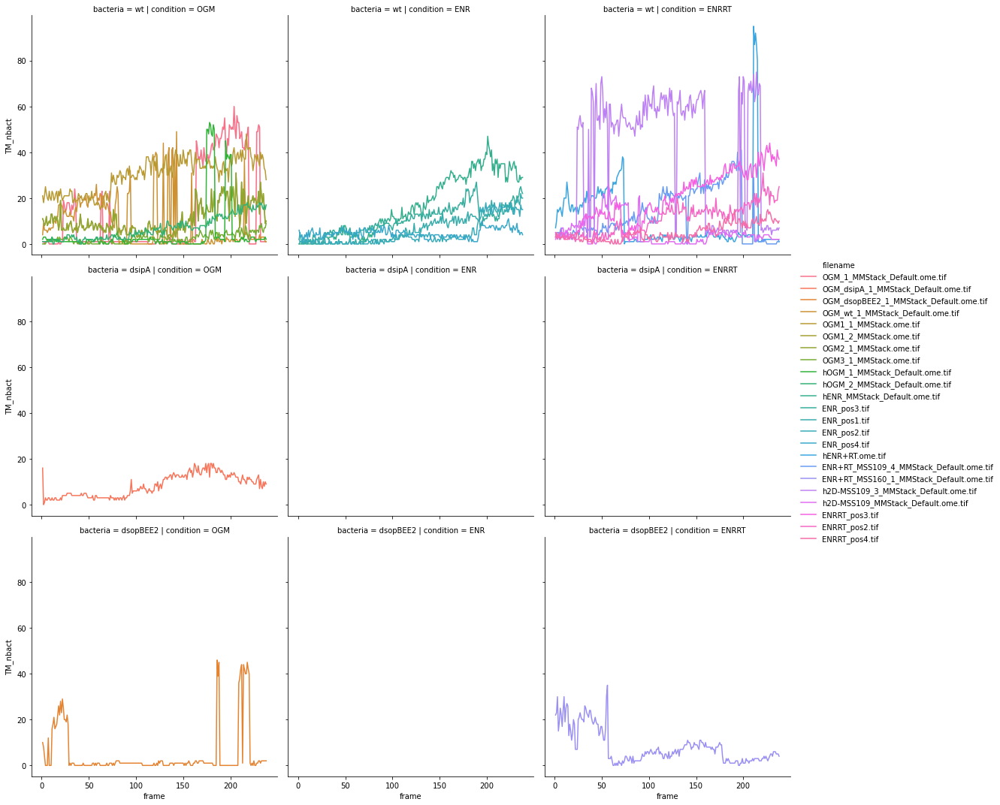

In [2]:
#Going through raw data inconcistensies vere found and corrected.
import pandas as pd
import seaborn as sns

df = pd.read_csv(r"F:\BactUnet\bacteria_count_V2.csv")
g = sns.relplot(data=df, x='frame', y='TM_nbact', kind='line', hue='filename', col='condition', row='bacteria')
g.figure.set_size_inches(20, 10)

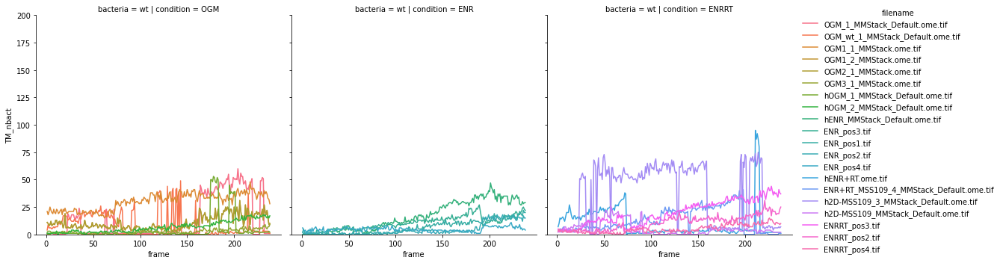

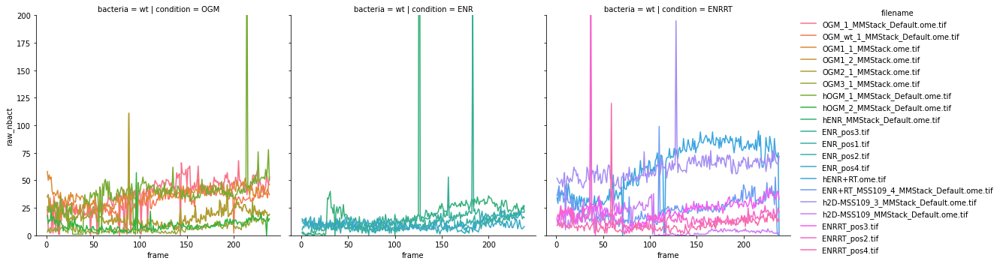

In [4]:
df2 = df[df.bacteria == 'wt']
g1 = sns.relplot(data=df2, x='frame', y='TM_nbact', kind='line', hue='filename', col='condition', row='bacteria')
g1.set(ylim=(0,200))
g2 = sns.relplot(data=df2, x='frame', y='raw_nbact', kind='line', hue='filename', col='condition', row='bacteria')
g2.set(ylim=(0,200))

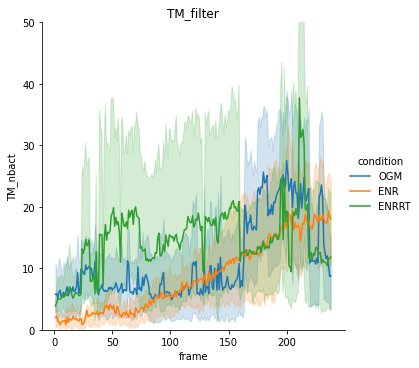

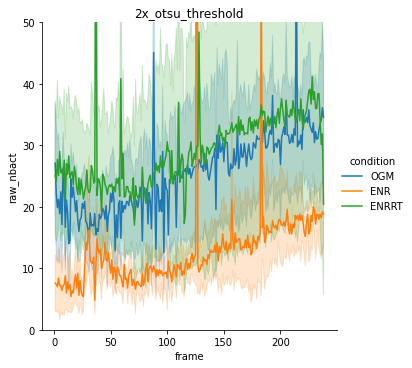

In [18]:
g1 = sns.relplot(data=df2, x='frame', y='TM_nbact', kind='line', hue='condition')
g1.set(ylim=(0,50))
g1.set(title = "TM_filter")
g2 = sns.relplot(data=df2, x='frame', y='raw_nbact', kind='line', hue='condition')
g2.set(ylim=(0,50))
g2.set(title = "2x_otsu_threshold")

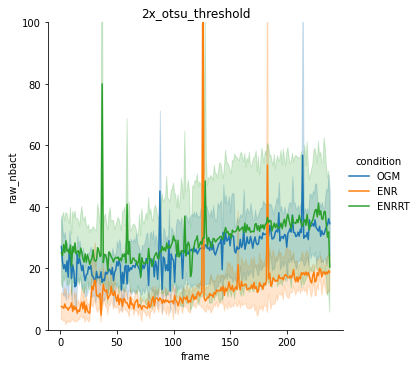

In [17]:
g2 = sns.relplot(data=df2, x='frame', y='raw_nbact', kind='line', hue='condition')
g2.set(ylim=(0,100))
g2.set(title = "2x_otsu_threshold")

In [12]:
df2.groupby('condition')['filename'].nunique()

condition
ENR      5
ENRRT    7
OGM      8
Name: filename, dtype: int64

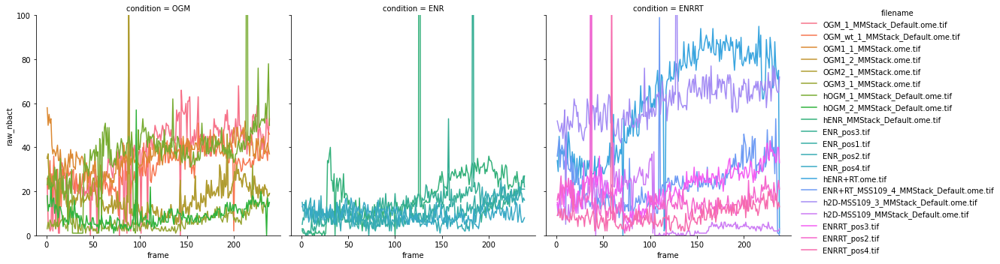

In [20]:
g2 = sns.relplot(data=df2, x='frame', y='raw_nbact', kind='line', hue='filename', col='condition')
g2.set(ylim=(0,100))
#g2.set(title = "2x_otsu_threshold")

AttributeError: 'FacetGrid' object has no attribute 'figure'

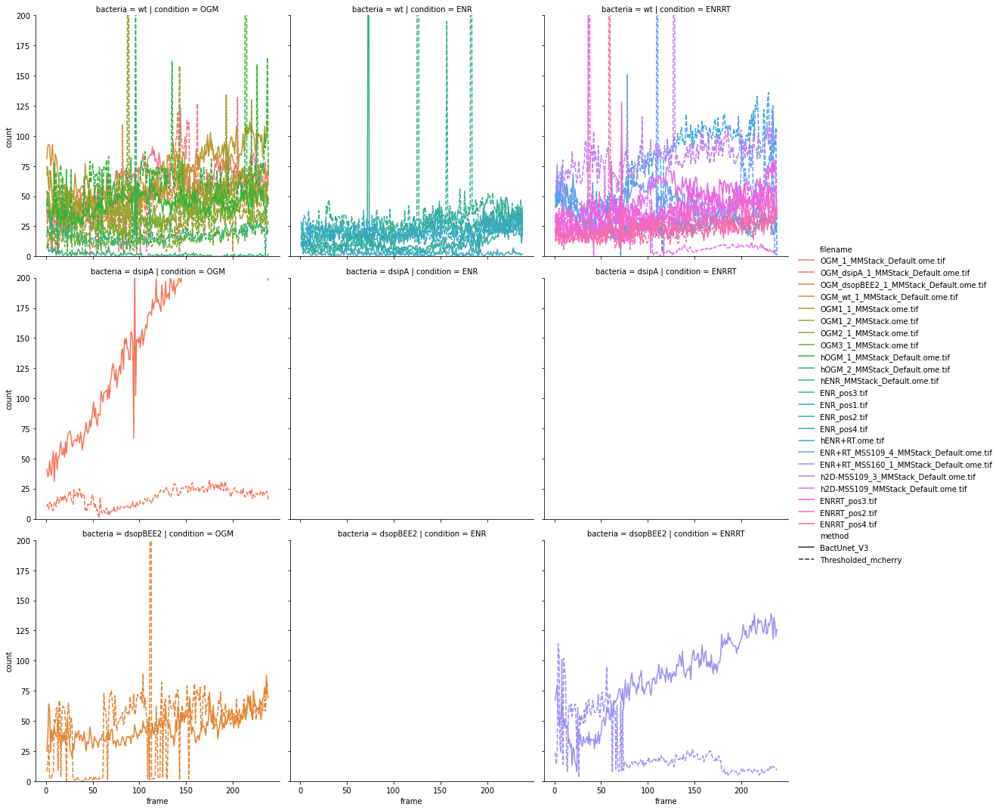

In [3]:
df = pd.read_csv(r"F:\BactUnet\bacteria_count_bactunet_V3.csv")
g = sns.relplot(data=df, x='frame', y='count', kind='line', hue='filename', col='condition', row='bacteria', style='method')
g.set(ylim=(0,200))
g.figure.set_size_inches(20, 10)

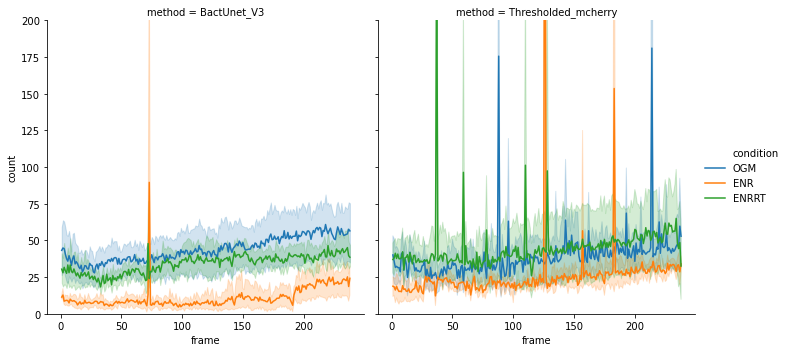

In [31]:
df2 = df[df.bacteria == 'wt']
g1 = sns.relplot(data=df2, x='frame', y='count', kind='line', hue='condition', col='method')
g1.set(ylim=(0,200))


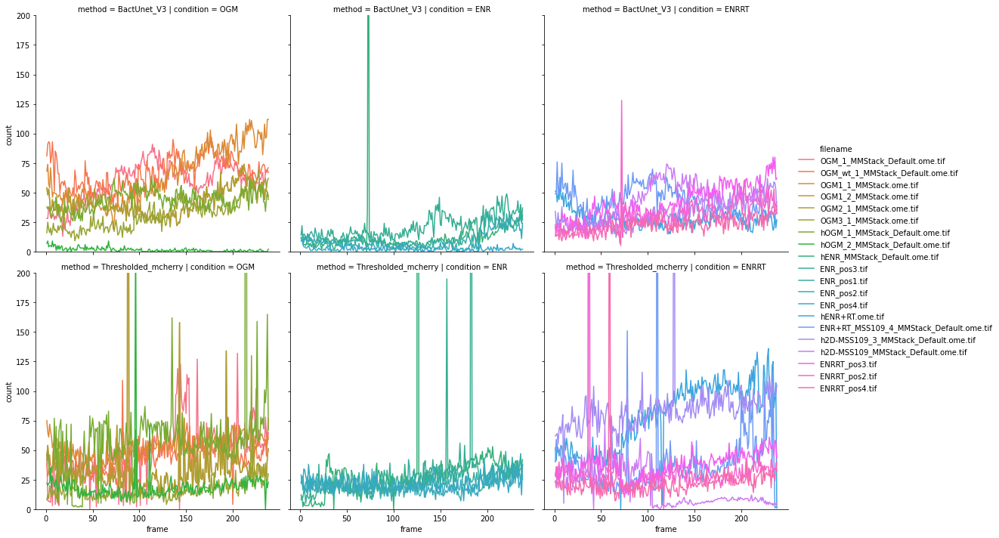

In [32]:
g1 = sns.relplot(data=df2, x='frame', y='count', kind='line', hue='filename', row='method', col='condition')
g1.set(ylim=(0,200))

In [65]:
# filter outlier values differing 7 sigma from 3 closest values to left and right
import numpy as np

def hampel(vals_orig, k=7, t0=3):
    '''
    vals: pandas series of values from which to remove outliers
    k: size of window (including the sample; 7 is equal to 3 on either side of value)
    '''
    #Make copy so original not edited
    vals=vals_orig.copy()    
    #Hampel Filter
    L= 1.4826
    rolling_median=vals.rolling(k).median()
    difference=np.abs(rolling_median-vals)
    median_abs_deviation=difference.rolling(k).median()
    threshold= t0 *L * median_abs_deviation
    outlier_idx=difference>threshold
    vals[outlier_idx]=np.nan
    return(vals)

no_outliers = None
onlywt = df2

for m in onlywt.method.unique():
    sf = onlywt[onlywt['method']==m]
    for fn in onlywt.filename.unique():
        ssf = sf[(sf['filename']==fn)]
        cnts = ssf['count']
        ssf['count_hampel'] = hampel(cnts, 7, 5)
        if no_outliers is None:
            no_outliers = ssf
        no_outliers = pd.concat((no_outliers, ssf), ignore_index=True)

C:\Users\Jens\miniconda3\lib\site-packages\ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jens\miniconda3\lib\site-packages\ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\Jens\miniconda3\lib\site-packages\ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pand

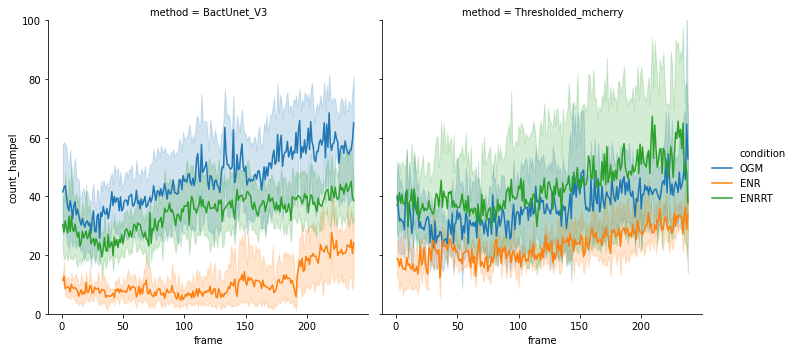

In [66]:
g2 = sns.relplot(data=no_outliers.dropna(), x='frame', y='count_hampel', kind='line', hue='condition', col='method')
g2.set(ylim=(0,100))

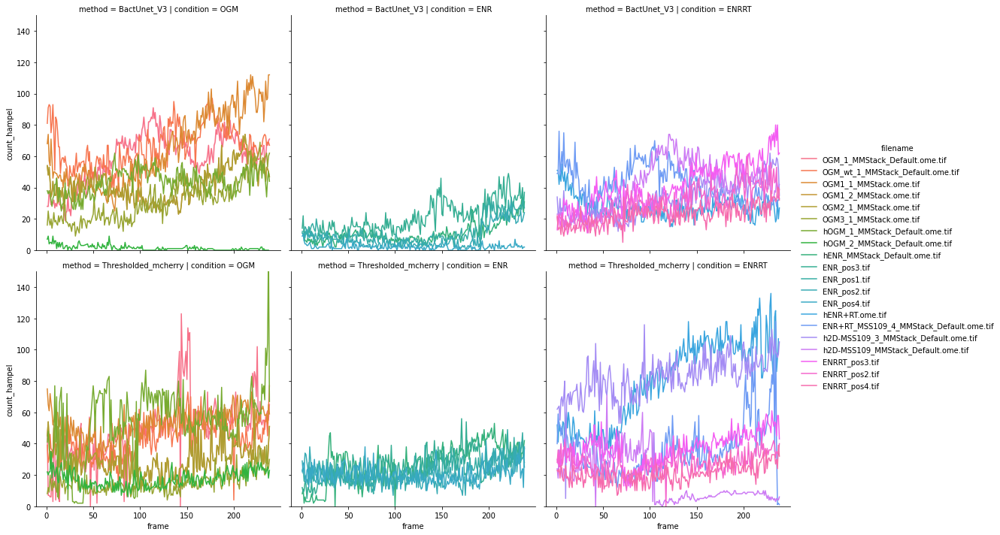

In [38]:
g1 = sns.relplot(data=no_outliers, x='frame', y='count_hampel', kind='line', hue='filename', row='method', col='condition')
g1.set(ylim=(0,150))

In [74]:
#df_ratio = df2[df2.method == 'BactUnet_V3']
#df_ratio['count_FL'] = df2[df2.method == 'Thresholded_mcherry']['count']
df_ratio = pd.merge(no_outliers[no_outliers.method == 'BactUnet_V3'], no_outliers[no_outliers.method == 'Thresholded_mcherry'], on=["frame", "filename", "filepath", "bacteria", "condition", "experiment"])
df_ratio = df_ratio.dropna()
df_ratio['ratio'] = df_ratio['count_hampel_y'] / df_ratio['count_hampel_x']
df_ratio.describe()

,frame,count_x,count_hampel_x,count_y,count_hampel_y,ratio
count,4656.000000,4656.000000,4656.000000,4656.000000,4656.000000,4656.000000
mean,119.051117,33.495275,33.495275,36.071091,36.071091,inf
std,68.622897,22.412738,22.412738,22.883995,22.883995,NaN
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,60.000000,16.000000,16.000000,20.000000,20.000000,0.696065
50%,119.000000,32.000000,32.000000,30.000000,30.000000,1.061862
75%,178.000000,48.250000,48.250000,47.250000,47.250000,2.286508
max,238.000000,112.000000,112.000000,165.000000,165.000000,inf


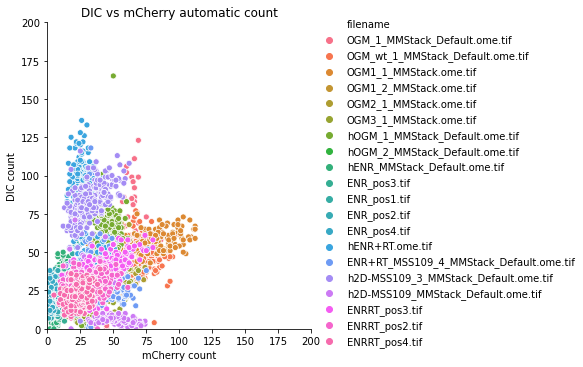

In [70]:
g1 = sns.relplot(data=df_ratio, x='count_hampel_x', y='count_hampel_y', hue='filename')
g1.set(ylim=(0,200), xlim=(0,200), xlabel="mCherry count", ylabel="DIC count", title = "DIC vs mCherry automatic count")

[Text(0.5, 1.0, 'DIC vs mCherry automatic count ratio'),
 Text(0, 0.5, 'mCherry/DIC counts')]

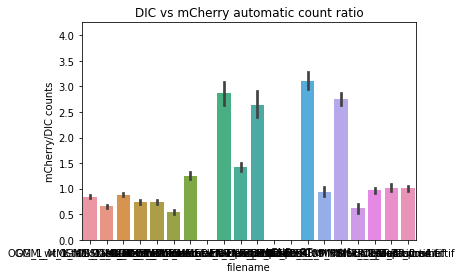

In [76]:
g = sns.barplot(data=df_ratio, x='filename', y='ratio')
g.set(title = "DIC vs mCherry automatic count ratio", ylabel="mCherry/DIC counts")

In [3]:
import pandas as pd
import seaborn as sns
#load manually counted GT data
df_man = pd.read_csv(r"manual_counts.csv", sep=";")

df_man.head()

,file,mCherry manual,DIC maual,ratio,frame
0,BT404,78,155,"0,503225806",199
1,BT398,115,157,"0,732484076",210
2,BT398,118,162,"0,728395062",211
3,BT398,113,159,"0,710691824",212
4,BT398,113,164,"0,68902439",213


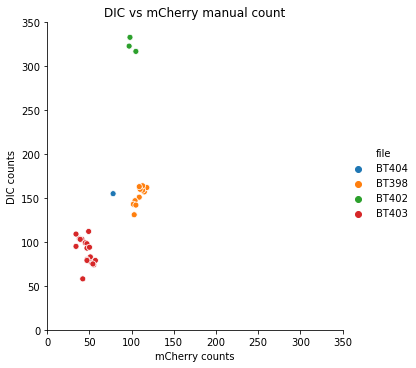

In [24]:
g = sns.relplot(data=df_man, x='mCherry manual', y='DIC maual', hue='file')
g.set(title = "DIC vs mCherry manual count", xlabel="mCherry counts", ylabel="DIC counts")
g.set(ylim=(0,350))
g.set(xlim=(0,350))

[Text(0.5, 1.0, 'DIC vs mCherry manual count ratio'),
 Text(0, 0.5, 'mCherry/DIC counts')]

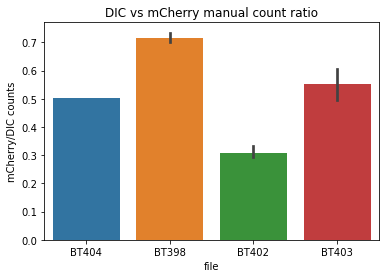

In [29]:
df_man['ratio'] = df_man['mCherry manual'] / df_man['DIC maual']
g = sns.barplot(data=df_man, x='file', y='ratio')
g.set(title = "DIC vs mCherry manual count ratio", ylabel="mCherry/DIC counts")

In [4]:
#load manually counted GT data
import pandas as pd
import seaborn as sns
df_man = pd.read_csv(r"manual_counts_mCherry.csv", sep=";")

df_man.describe()

,mCh_manual,DIC_maual,frame,mCh_auto
count,37.000000,37.000000,37.000000,37.000000
mean,70.540541,128.135135,154.054054,59.081081
std,30.092076,67.423274,99.101224,48.463261
min,34.000000,58.000000,1.000000,0.000000
25%,47.000000,81.000000,10.000000,26.000000
50%,52.000000,103.000000,213.000000,33.000000
75%,104.000000,155.000000,229.000000,121.000000
max,118.000000,333.000000,238.000000,138.000000


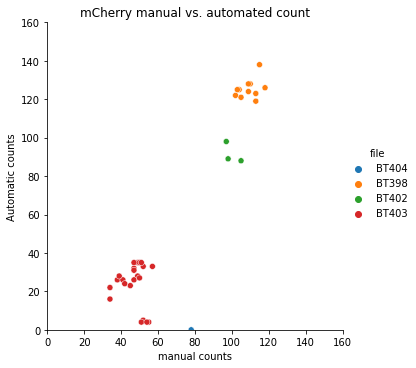

In [7]:
g = sns.relplot(data=df_man, x='mCh_manual', y='mCh_auto', hue='file')
g.set(title = "mCherry manual vs. automated count", xlabel="manual counts", ylabel="Automatic counts")
g.set(ylim=(0,160))
g.set(xlim=(0,160))

[Text(0.5, 1.0, 'Automatic vs manual mCherry count ratio'),
 Text(0, 0.5, 'automatic/manual counts')]

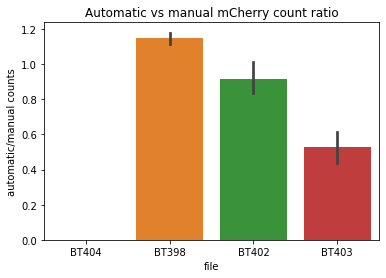

In [9]:
df_man['ratio'] = df_man['mCh_auto'] / df_man['mCh_manual']
g = sns.barplot(data=df_man, x='file', y='ratio')
g.set(title = "Automatic vs manual mCherry count ratio", ylabel="automatic/manual counts")